<h1 style="font-family:verdana;"> <center>🐈Animals Image Classification🐈</center> </h1>
<p><center style="font-family:cursive; font-size:px;">Rehana Putri Salsabilla (5027221015)</center></p>
<p><center style="font-family:cursive; font-size:px;">Salsabila Amalia Harjanto (5027221023)</center></p>

# 🔭Load Data + Exploratory Data Analysis

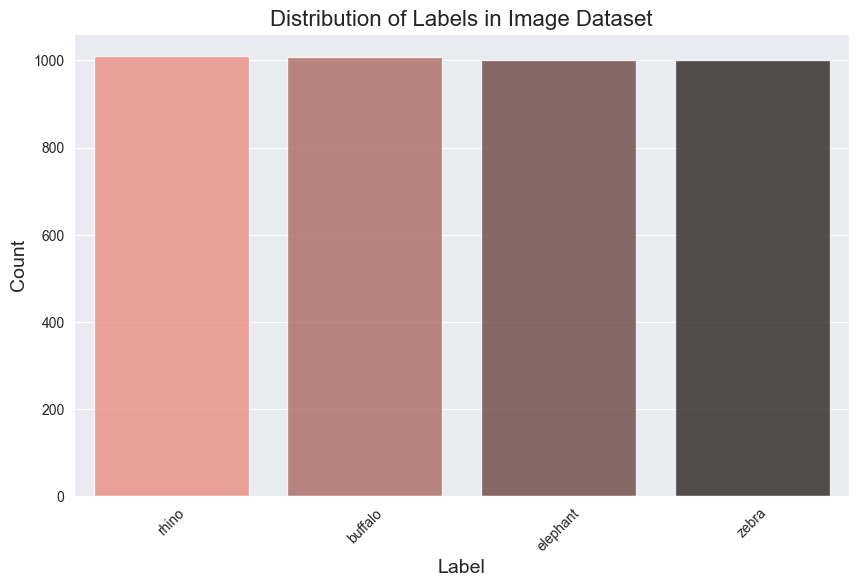

In [ ]:
# Import Data Science Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import EfficientNetB0

# System libraries
from pathlib import Path
import os.path
import random

# Visualization Libraries
import matplotlib.cm as cm
import seaborn as sns

sns.set_style('darkgrid')

# Metrics
from sklearn.metrics import classification_report, confusion_matrix
import itertools

# Define constants
BATCH_SIZE = 32
TARGET_SIZE = (224, 224)
DATA_DIR = Path("../dataset")  # Path to your dataset directory

# Walk through each directory and get filepaths and labels
filepaths = list(DATA_DIR.glob(r'**/*.jpg')) + list(DATA_DIR.glob(r'**/*.jpeg')) + list(DATA_DIR.glob(r'**/*.png'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Display distribution of the labels
label_counts = image_df['Label'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='dark:salmon_r')
plt.title('Distribution of Labels in Image Dataset', fontsize=16)
plt.xlabel('Label', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.show()


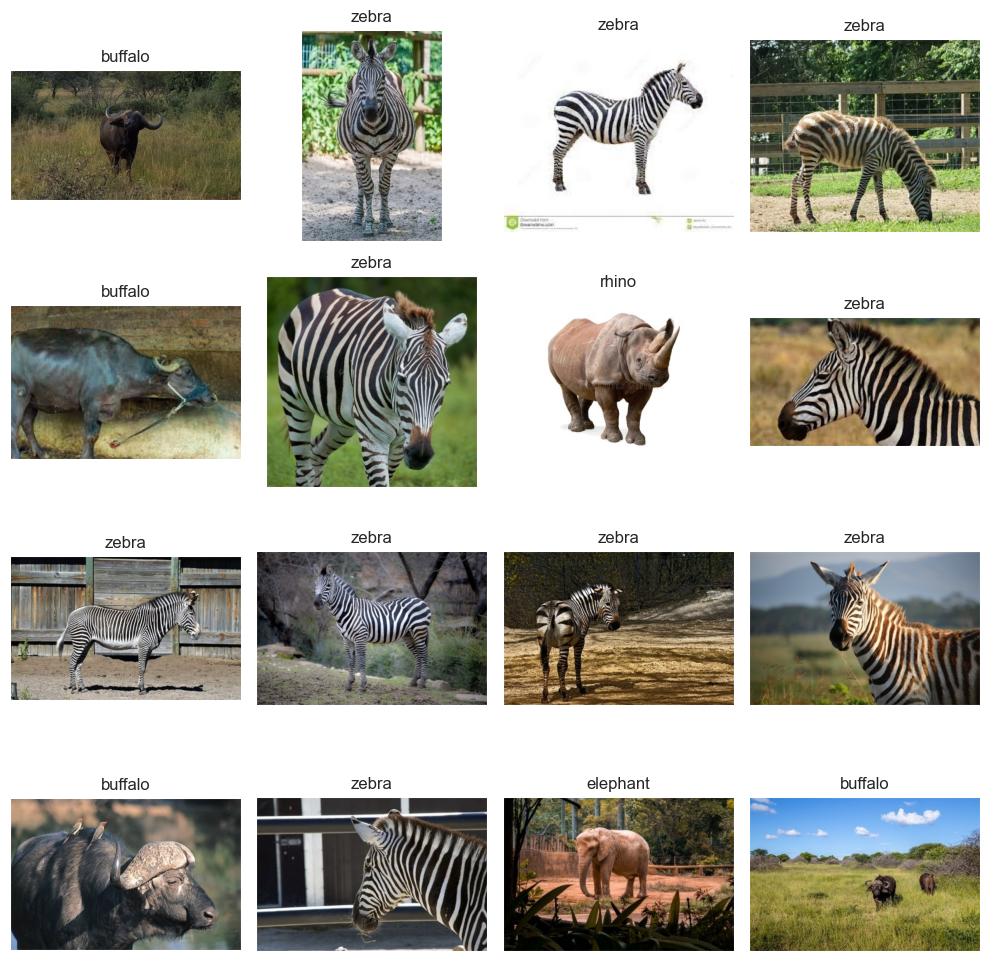

In [ ]:
# Display 16 pictures of the dataset with their labels
random_index = np.random.randint(0, len(image_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[random_index[i]]))
    ax.set_title(image_df.Label[random_index[i]])
plt.tight_layout()
plt.show()


d:\anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
d:\anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
d:\anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
d:\anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_

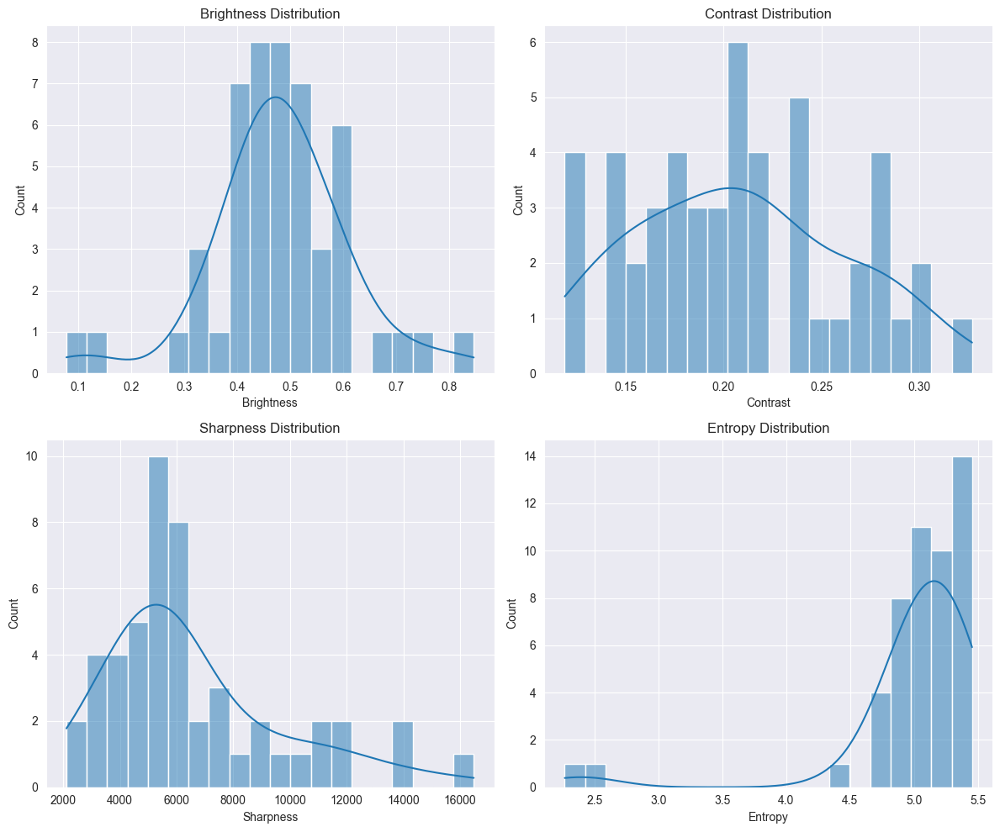

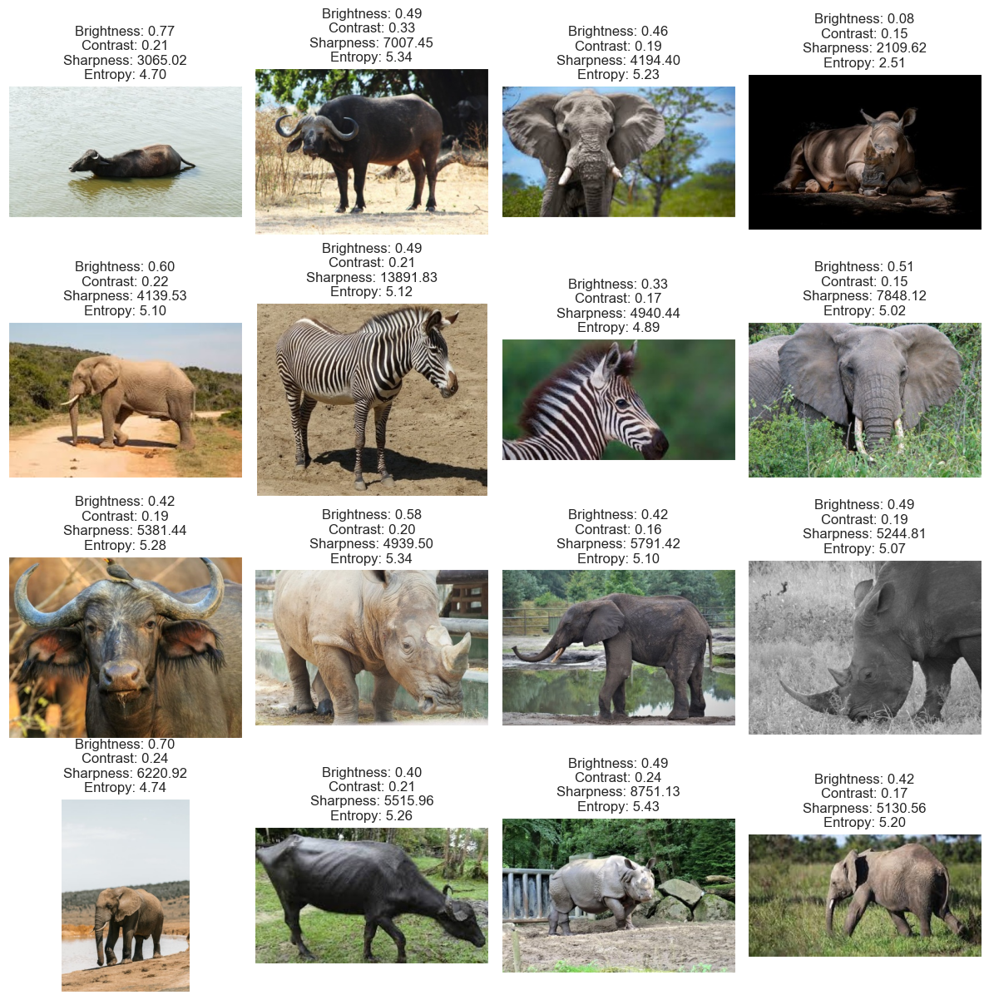

In [ ]:
from skimage import io, color
from skimage.filters import sobel
from skimage.exposure import histogram
import scipy.stats as stats

# Function to compute image quality measures
def compute_image_quality_measures(image_path):
    image = io.imread(image_path)
    if len(image.shape) == 3:
        image_gray = color.rgb2gray(image)
    else:
        image_gray = image

    # Brightness: mean pixel value
    brightness = np.mean(image_gray)

    # Contrast: standard deviation of pixel values
    contrast = np.std(image_gray)

    # Sharpness: sum of the Sobel filter response (more efficient calculation)
    sharpness = np.sum(np.abs(sobel(image_gray)))

    # Entropy: entropy of the histogram
    hist, _ = histogram(image_gray)
    entropy = stats.entropy(hist)

    return brightness, contrast, sharpness, entropy

# Compute quality measures for a smaller random subset of images
subset_size = 50
random_indices = np.random.choice(image_df.index, subset_size, replace=False)

quality_measures = {
    'Filepath': [],
    'Brightness': [],
    'Contrast': [],
    'Sharpness': [],
    'Entropy': []
}

for idx in random_indices:
    filepath = image_df.Filepath[idx]
    brightness, contrast, sharpness, entropy = compute_image_quality_measures(filepath)
    quality_measures['Filepath'].append(filepath)
    quality_measures['Brightness'].append(brightness)
    quality_measures['Contrast'].append(contrast)
    quality_measures['Sharpness'].append(sharpness)
    quality_measures['Entropy'].append(entropy)

quality_df = pd.DataFrame(quality_measures)

# Plot histograms of the quality measures
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

sns.histplot(quality_df['Brightness'], bins=20, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Brightness Distribution')

sns.histplot(quality_df['Contrast'], bins=20, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Contrast Distribution')

sns.histplot(quality_df['Sharpness'], bins=20, kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Sharpness Distribution')

sns.histplot(quality_df['Entropy'], bins=20, kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Entropy Distribution')

plt.tight_layout()
plt.show()

# Display 16 pictures with their quality measures
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 12),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    idx = random_indices[i]
    img = io.imread(image_df.Filepath[idx])
    q_idx = quality_df.index[quality_df['Filepath'] == image_df.Filepath[idx]][0]
    ax.imshow(img)
    ax.set_title(f"Brightness: {quality_df.iloc[q_idx]['Brightness']:.2f}\nContrast: {quality_df.iloc[q_idx]['Contrast']:.2f}\nSharpness: {quality_df.iloc[q_idx]['Sharpness']:.2f}\nEntropy: {quality_df.iloc[q_idx]['Entropy']:.2f}")
plt.tight_layout()
plt.show()


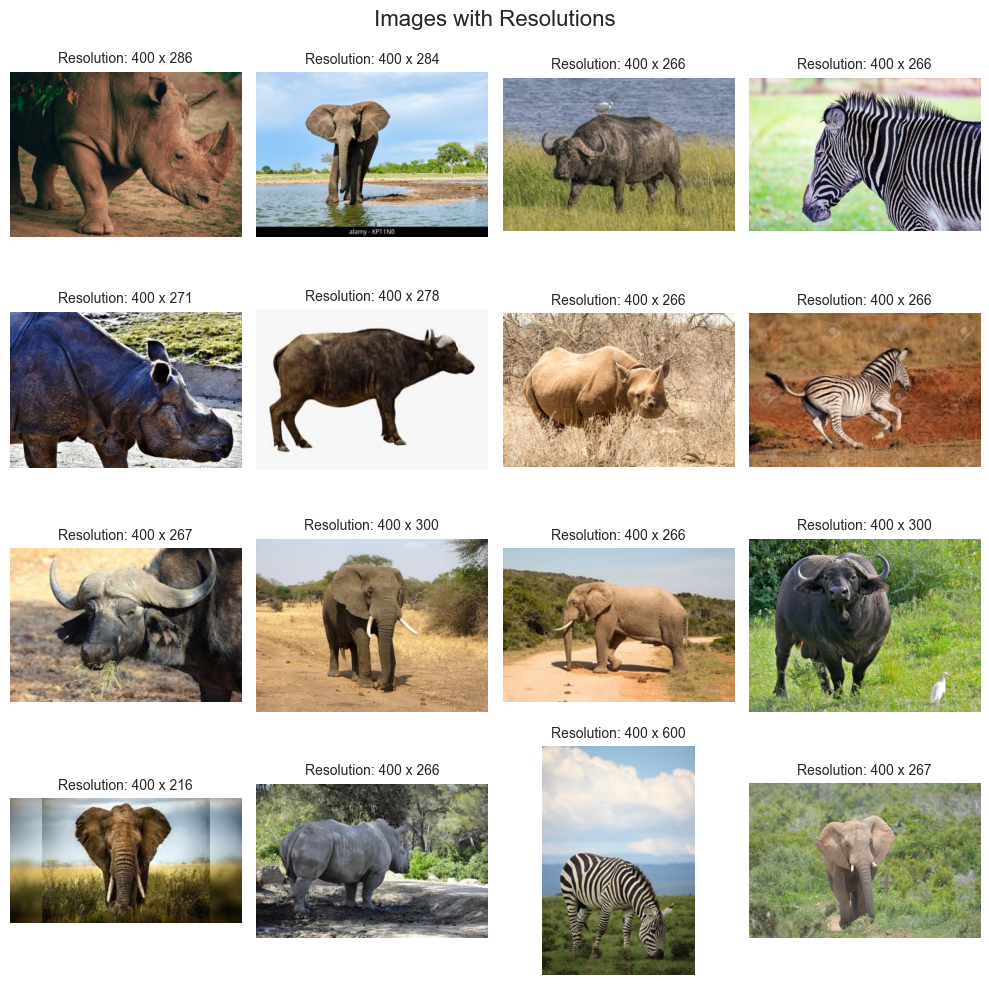

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

# Define the function to get the resolution of an image
def get_image_resolution(image_path):
    with Image.open(image_path) as img:
        return img.size

# Function to display images with their resolutions
def display_images_with_resolution(image_df, num_images=16):
    # Select random images
    random_indices = random.sample(range(len(image_df)), num_images)

    # Display images with their resolutions
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))
    fig.suptitle('Images with Resolutions', fontsize=16)

    for i, index in enumerate(random_indices):
        image_path = image_df.iloc[index]['Filepath']
        resolution = get_image_resolution(image_path)

        # Load and display image
        img = Image.open(image_path)
        ax = axes[i // 4, i % 4]
        ax.imshow(img)
        ax.set_title(f"Resolution: {resolution[0]} x {resolution[1]}", fontsize=10)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Display images with their resolutions
display_images_with_resolution(image_df, num_images=16)

# 📉Error Level Analysis

In [ ]:
import os
import random
from PIL import Image, ImageChops, ImageEnhance
import matplotlib.pyplot as plt

# Sample function to get a random image path from a directory
def random_sample(directory):
    files = [os.path.join(directory, f) for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
    return random.choice(files)

# Function to compute Error Level Analysis (ELA)
def compute_ela_pil(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15

    # Open the image using PIL
    orig_img = Image.open(path)
    orig_img.save(temp_filename, 'JPEG', quality=quality)

    # Read the compressed image
    compressed_img = Image.open(temp_filename)

    # Compute the absolute difference between original and compressed images
    diff = ImageChops.difference(orig_img, compressed_img)
    diff = diff.convert('L')  # Convert to grayscale
    diff = np.array(diff)  # Convert to numpy array

    # Scale the difference
    diff = SCALE * np.array(diff)
    return diff

# Function to convert to ELA image
def convert_to_ela_image_pil(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'

    # Open the image using PIL
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality=quality)
    temp_image = Image.open(temp_filename)

    # Compute the difference
    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1

    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)

    return ela_image


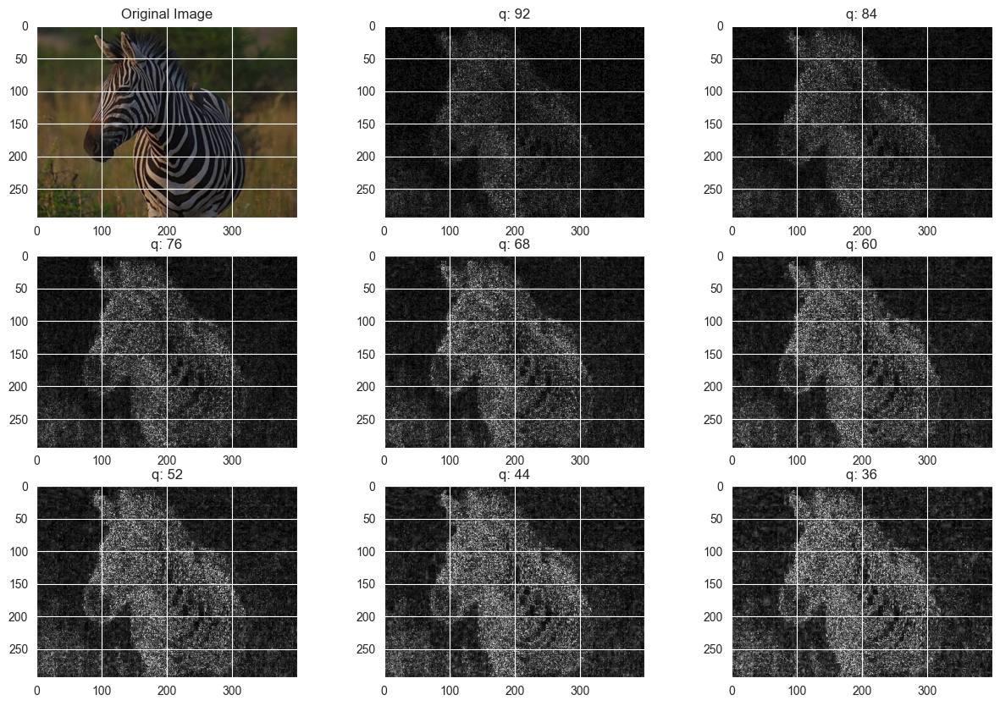

In [ ]:
# Import the necessary modules
from PIL import Image, ImageChops, ImageEnhance

# View random sample from the dataset and ELA
p = random_sample('../dataset/zebra')  # Adjust the path accordingly
orig = Image.open(p).convert('RGB')
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality = init_val - (i-1) * 8
    ela_img = convert_to_ela_image_pil(path=p, quality=quality)
    if i == 1:
        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text('Original Image')
        plt.imshow(orig)
    else:
        img = compute_ela_pil(path=p, quality=quality)
        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text(f'q: {quality}')
        plt.imshow(img, cmap='gray')
plt.show()


# 📥Data Preprocessing + Augmentation

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split, GridSearchCV
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Define constants
TARGET_SIZE = (224, 224)
BATCH_SIZE = 32

# Assuming image_df is defined with columns 'Filepath' and 'Label'
# Separate data into train and test sets
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

# Define ImageDataGenerator for training and testing with preprocessing
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

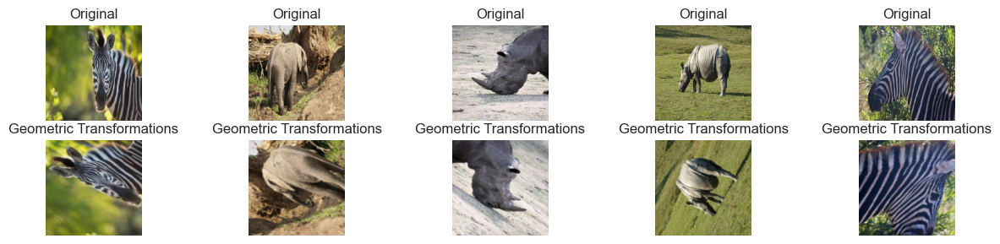

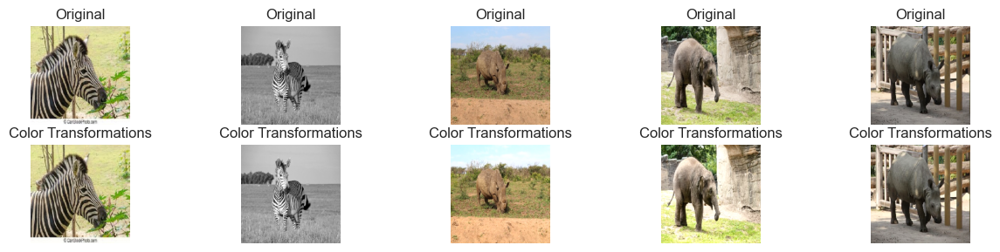

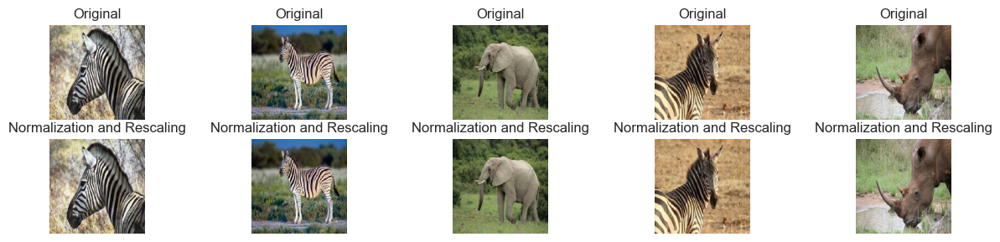

In [ ]:
# Augmentasi
def plot_augmentation_examples(dataset, augmentation_layer, title, num_examples=5):
    plt.figure(figsize=(15, 5))
    images, labels = next(dataset)
    augmented_images = augmentation_layer(images, training=True)

    # Normalize images to [0, 1] range for display
    def normalize_image(image):
        min_val = tf.reduce_min(image)
        max_val = tf.reduce_max(image)
        return (image - min_val) / (max_val - min_val)

    for i in range(num_examples):
        ax = plt.subplot(3, num_examples, i + 1)
        plt.imshow(normalize_image(images[i]).numpy())
        plt.title("Original")
        plt.axis("off")

        ax = plt.subplot(3, num_examples, i + 1 + num_examples)
        plt.imshow(normalize_image(augmented_images[i]).numpy())
        plt.title(title)
        plt.axis("off")

    plt.show()


# Definisikan layer augmentasi dalam kelompok
geometric_augment = tf.keras.Sequential([
    tf.keras.layers.Resizing(224, 224),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
    tf.keras.layers.RandomWidth(0.2),
    tf.keras.layers.RandomHeight(0.2),
    tf.keras.layers.RandomCrop(200, 200)
])

color_augment = tf.keras.Sequential([
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.2)
])

normalization_augment = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255)
])

# Plot hasil augmentasi untuk setiap kelompok
plot_augmentation_examples(train_images, geometric_augment, "Geometric Transformations")
plot_augmentation_examples(train_images, color_augment, "Color Transformations")
plot_augmentation_examples(train_images, normalization_augment, "Normalization and Rescaling")

In [ ]:
# Split the data into three categories.
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 2572 validated image filenames belonging to 4 classes.
Found 643 validated image filenames belonging to 4 classes.
Found 804 validated image filenames belonging to 4 classes.


# 🚄Model Training + Hyperparameter Tunning

In [ ]:

# Function to create EfficientNet model with tunable hyperparameters
def create_efficientnet_model(learning_rate=0.001, dense_units=128, dropout_rate=0.45):
    pretrained_model_efficientnet = tf.keras.applications.EfficientNetB0(
        input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3),
        include_top=False,
        weights='imagenet',
        pooling='max'
    )

    pretrained_model_efficientnet.trainable = False

    model_efficientnet = Sequential([
        pretrained_model_efficientnet,
        Dense(dense_units, activation='relu'),
        Dropout(dropout_rate),
        Dense(dense_units, activation='relu'),
        Dropout(dropout_rate),
        Dense(4, activation='softmax')  # Adjust number of classes if needed
    ])

    model_efficientnet.compile(optimizer=Adam(learning_rate),
                               loss='categorical_crossentropy',
                               metrics=['accuracy'])

    return model_efficientnet

# Function to create CNN model with tunable hyperparameters
def create_cnn_model(learning_rate=0.001, dense_units=128, dropout_rate=0.5):
    model_cnn = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(dense_units, activation='relu'),
        Dropout(dropout_rate),
        Dense(dense_units, activation='relu'),
        Dropout(dropout_rate),
        Dense(4, activation='softmax')  # Adjust number of classes if needed
    ])

    model_cnn.compile(optimizer=Adam(learning_rate),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

    return model_cnn

# Define parameter grid for hyperparameter tuning
param_grid_efficientnet = {
    'learning_rate': [0.001, 0.0001],
    'dense_units': [128, 256],
    'dropout_rate': [0.5]
}

param_grid_cnn = {
    'learning_rate': [0.001, 0.0001],
    'dense_units': [128, 256],
    'dropout_rate': [0.5]
}
# Function to perform hyperparameter tuning manually
def manual_grid_search(param_grid, model_func, train_images, val_images):
    best_model = None
    best_accuracy = 0
    best_params = None
    best_history = None

    for lr in param_grid['learning_rate']:
        for units in param_grid['dense_units']:
            for dropout in param_grid['dropout_rate']:
                print(f"Training with learning_rate={lr}, dense_units={units}, dropout_rate={dropout}")
                model = model_func(learning_rate=lr, dense_units=units, dropout_rate=dropout)

                # Create callbacks
                checkpoint_callback = ModelCheckpoint(f"best_model_{model_func.__name__}.weights.h5",
                                                      save_weights_only=True,
                                                      monitor="val_accuracy",
                                                      save_best_only=True)

                early_stopping = EarlyStopping(monitor="val_loss",
                                               patience=5,
                                               restore_best_weights=True)

                reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

                # Train the model
                history = model.fit(train_images,
                                    validation_data=val_images,
                                    epochs=10,
                                    callbacks=[early_stopping, checkpoint_callback, reduce_lr])

                # Evaluate the model
                results = model.evaluate(val_images, verbose=0)
                accuracy = results[1]
                if accuracy > best_accuracy:
                    best_accuracy = accuracy
                    best_model = model
                    best_params = {'learning_rate': lr, 'dense_units': units, 'dropout_rate': dropout}
                    best_history = history

    print(f"Best accuracy: {best_accuracy} with params: {best_params}")
    return best_model, best_params, best_history

# Perform manual grid search for EfficientNet and CNN models
best_model_efficientnet, best_params_efficientnet, history_efficientnet = manual_grid_search(param_grid_efficientnet, create_efficientnet_model, train_images, val_images)
best_model_cnn, best_params_cnn, history_cnn = manual_grid_search(param_grid_cnn, create_cnn_model, train_images, val_images)

# Choose the best model based on validation accuracy
if history_efficientnet.history['val_accuracy'][-1] > history_cnn.history['val_accuracy'][-1]:
    best_model = best_model_efficientnet
    best_params = best_params_efficientnet
    print("EfficientNet is the best model.")
else:
    best_model = best_model_cnn
    best_params = best_params_cnn
    print("Simple CNN is the best model.")

Training with learning_rate=0.001, dense_units=128, dropout_rate=0.5
Epoch 1/10


d:\anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


81/81 ━━━━━━━━━━━━━━━━━━━━ 76s 532ms/step - accuracy: 0.6378 - loss: 1.8582 - val_accuracy: 0.9751 - val_loss: 0.0617 - learning_rate: 0.0010
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 37s 447ms/step - accuracy: 0.9290 - loss: 0.2168 - val_accuracy: 0.9876 - val_loss: 0.0439 - learning_rate: 0.0010
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 37s 447ms/step - accuracy: 0.9457 - loss: 0.2031 - val_accuracy: 0.9876 - val_loss: 0.0465 - learning_rate: 0.0010
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 37s 455ms/step - accuracy: 0.9471 - loss: 0.1546 - val_accuracy: 0.9798 - val_loss: 0.0638 - learning_rate: 0.0010
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 33s 405ms/step - accuracy: 0.9667 - loss: 0.1455 - val_accuracy: 0.9907 - val_loss: 0.0383 - learning_rate: 0.0010
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 32s 398ms/step - accuracy: 0.9585 - loss: 0.1126 - val_accuracy: 0.9891 - val_loss: 0.0382 - learning_rate: 0.0010
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 37s 449ms/step - accuracy: 0.9643 - loss: 0.1148 - val_

d:\anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 35s 384ms/step - accuracy: 0.2746 - loss: 202.7239 - val_accuracy: 0.4572 - val_loss: 1.1446 - learning_rate: 0.0010
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 32s 389ms/step - accuracy: 0.4371 - loss: 1.1862 - val_accuracy: 0.4961 - val_loss: 1.0526 - learning_rate: 0.0010
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 30s 366ms/step - accuracy: 0.5523 - loss: 1.0267 - val_accuracy: 0.5194 - val_loss: 1.0248 - learning_rate: 0.0010
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 28s 345ms/step - accuracy: 0.5972 - loss: 0.9670 - val_accuracy: 0.5552 - val_loss: 0.9781 - learning_rate: 0.0010
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 30s 368ms/step - accuracy: 0.7010 - loss: 0.8065 - val_accuracy: 0.5490 - val_loss: 1.0562 - learning_rate: 0.0010
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 31s 379ms/step - accuracy: 0.7595 - loss: 0.6805 - val_accuracy: 0.5630 - val_loss: 0.9802 - learning_rate: 0.0010
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 34s 418ms/step - accuracy: 0.8037 - loss: 

# 📊Model Evaluation

In [ ]:
# Print test results of the best model
results = best_model.evaluate(test_images, verbose=0)
print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.03162
Test Accuracy: 98.88%


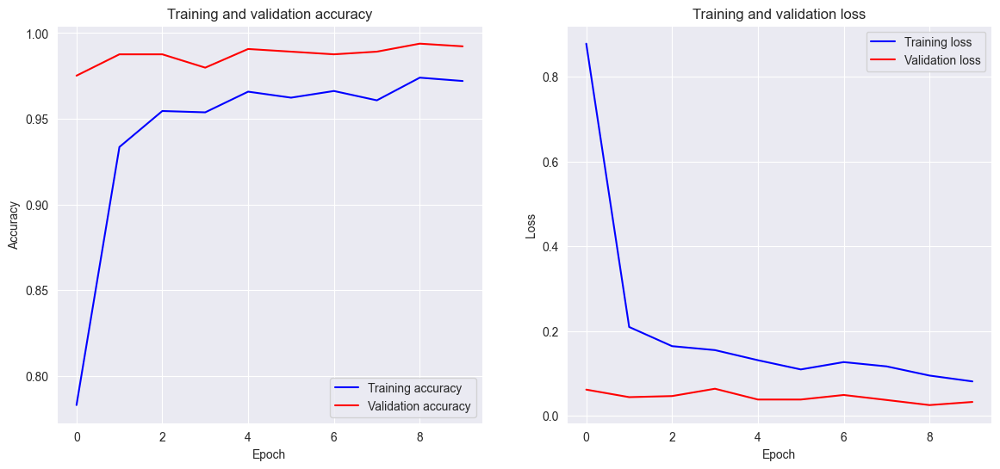

In [ ]:
# Plot training & validation accuracy values for the best model
accuracy = history_efficientnet.history['accuracy'] if best_model == best_model_efficientnet else history_cnn.history['accuracy']
val_accuracy = history_efficientnet.history['val_accuracy'] if best_model == best_model_efficientnet else history_cnn.history['val_accuracy']
loss = history_efficientnet.history['loss'] if best_model == best_model_efficientnet else history_cnn.history['loss']
val_loss = history_efficientnet.history['val_loss'] if best_model == best_model_efficientnet else history_cnn.history['val_loss']

epochs = range(len(accuracy))

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='best')

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')

plt.show()


# 🔮Prediction Result

In [ ]:
# Predict the labels of the test_images using the best model
pred = best_model.predict(test_images)
pred = np.argmax(pred, axis=1)

# Map the label indices to the actual labels
labels = (train_images.class_indices)
labels = dict((v, k) for k, v in labels.items())
pred = [labels[k] for k in pred]

# Display the first 5 predictions
print(f'The first 5 predictions: {pred[:5]}')

26/26 ━━━━━━━━━━━━━━━━━━━━ 19s 546ms/step
The first 5 predictions: ['rhino', 'elephant', 'zebra', 'elephant', 'elephant']


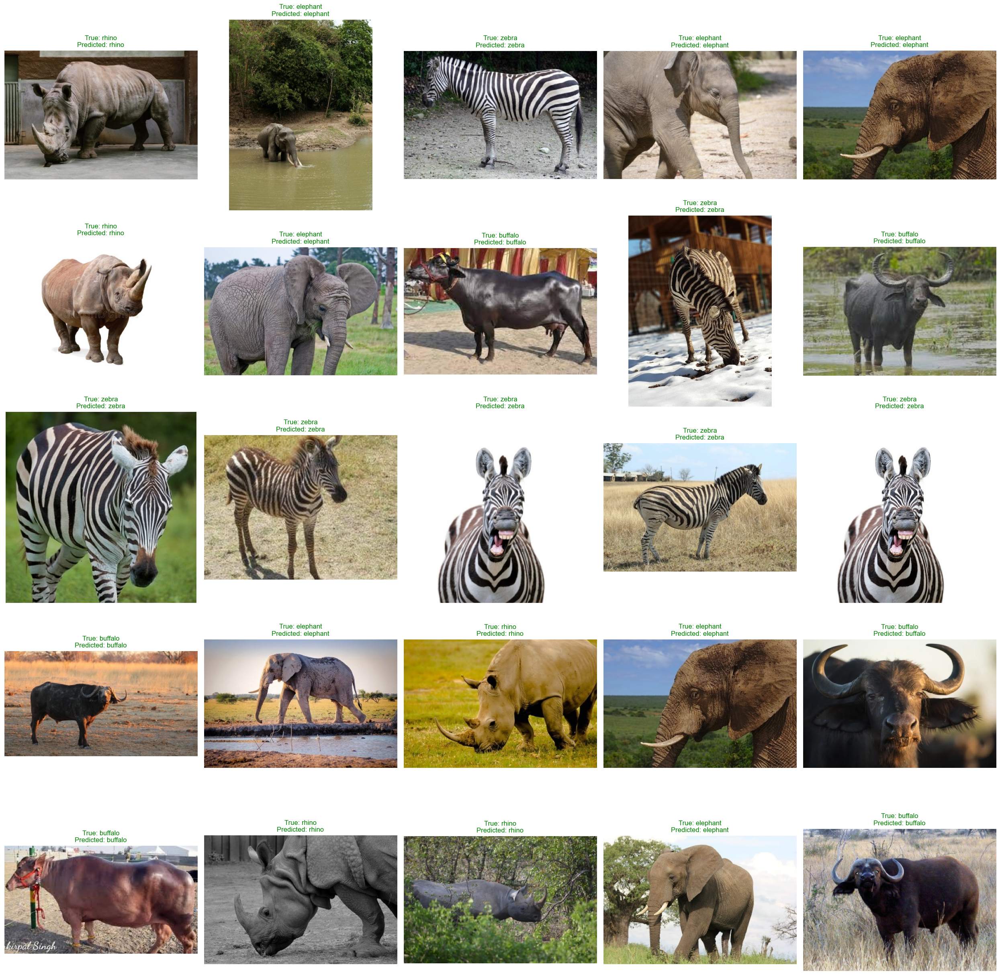

In [ ]:
# Display 25 random pictures from the dataset with their labels
random_indices = np.random.randint(0, len(test_df) - 1, 25)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(25, 25), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_indices[i]]))
    if test_df.Label.iloc[random_indices[i]] == pred[random_indices[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_indices[i]]}\nPredicted: {pred[random_indices[i]]}", color=color)

plt.tight_layout()
plt.show()

In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

     buffalo       0.97      1.00      0.98       213
    elephant       0.99      1.00      0.99       212
       rhino       1.00      0.97      0.98       189
       zebra       1.00      0.99      1.00       190

    accuracy                           0.99       804
   macro avg       0.99      0.99      0.99       804
weighted avg       0.99      0.99      0.99       804



In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
buffalo,0.968037,0.995305,0.981481,213.000000
elephant,0.990610,0.995283,0.992941,212.000000
rhino,1.000000,0.968254,0.983871,189.000000
zebra,1.000000,0.994737,0.997361,190.000000
accuracy,0.988806,0.988806,0.988806,0.988806
macro avg,0.989662,0.988395,0.988914,804.000000
weighted avg,0.989056,0.988806,0.988818,804.000000


In [ ]:
# Predict random image
def predict_image_class(img_path, model, class_indices):
    img_array = load_and_preprocess_image(img_path)
    predictions = model.predict(img_array)

    # Get the filename from the path
    img_filename = os.path.basename(img_path)

    # Debugging: Print the name of the example image
    print(f'Example image: {img_filename}')

    predicted_class_index = np.argmax(predictions, axis=1)[0]

    # Debugging: Print predicted class index and class indices dictionary
    print(f'Predicted class index: {predicted_class_index}')
    print(f'Class indices dictionary: {class_indices}')

    predicted_class_label = class_indices.get(predicted_class_index, "Unknown")
    return predicted_class_label

# Get the class indices from the training generator
class_indices = {v: k for k, v in train_images.class_indices.items()}

# Test the prediction function with an example image
img_path = '../dataset/elephant/Elephant_10.jpg'  # Replace with the path to your image
predicted_class = predict_image_class(img_path, best_model, class_indices)
print(f'Predicted class for {os.path.basename(img_path)}: {predicted_class}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step
Example image: Elephant_10.jpg
Predicted class index: 1
Class indices dictionary: {0: 'buffalo', 1: 'elephant', 2: 'rhino', 3: 'zebra'}
Predicted class for Elephant_10.jpg: elephant


# ☀️Grad-Cam Visualization

In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.input], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


In [ ]:
import numpy as np
import matplotlib.cm as cm
from PIL import Image

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = Image.open(img_path)
    img = img.resize((224, 224))  # Make sure the image is resized to the target size
    img = np.array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = Image.fromarray((jet_heatmap * 255).astype(np.uint8))
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = np.array(jet_heatmap)

    # Superimpose the heatmap on the original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = Image.fromarray((superimposed_img).astype(np.uint8))

    # Save the superimposed image
    superimposed_img.save(cam_path)

    return cam_path


C:\Users\salsa\AppData\Local\Temp\ipykernel_7748\2777080346.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")
C:\Users\salsa\AppData\Local\Temp\ipykernel_7748\2777080346.py:12: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


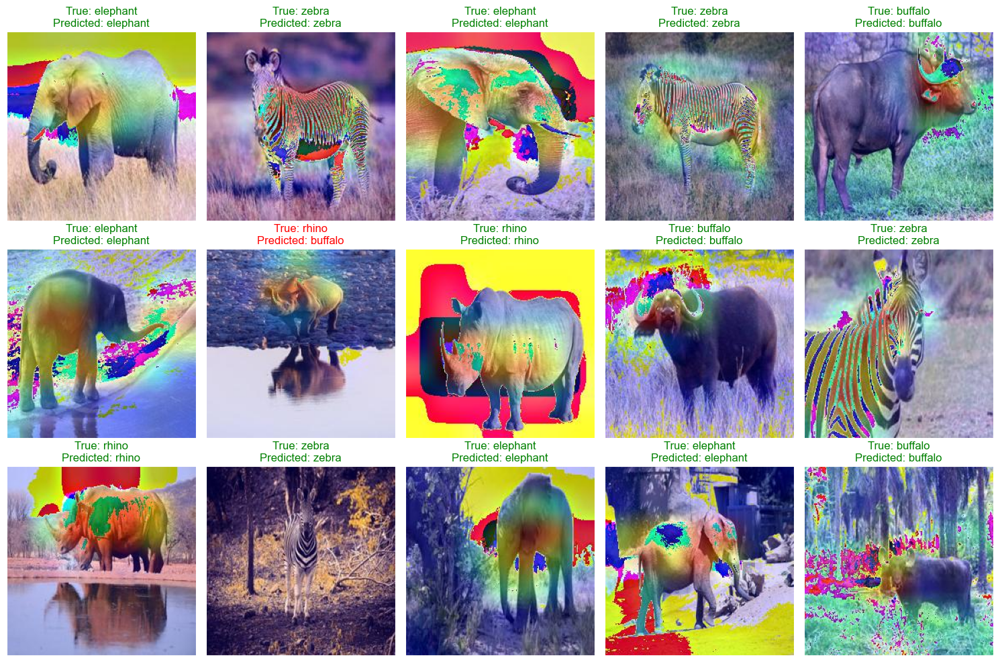

In [ ]:
import random
import matplotlib.pyplot as plt

# Select random indices to display
random_indices = random.sample(range(len(test_df)), 15)

# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10), subplot_kw={'xticks': [], 'yticks': []})

img_size = (224, 224)
last_conv_layer_name = "top_conv"  # Update with the correct last conv layer name in your model

def get_img_array(img_path, size):
    # `img` is a PIL image of size 224x224
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (224, 224, 3)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 224, 224, 3)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_indices[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))

    # Check if the prediction is true or false
    if test_df.Label.iloc[random_indices[i]] == pred[random_indices[i]]:
        color = "green"
    else:
        color = "red"

    ax.set_title(f"True: {test_df.Label.iloc[random_indices[i]]}\nPredicted: {pred[random_indices[i]]}", color=color)

plt.tight_layout()
plt.show()
